# Лабораторная работа №3
## Выполнили Максимов Артём и Смирнов Егор

В этой лабораторной работе мы провели анализ данных о землетресениях и провели кластеризацию этих данных по немкольким признакам и с помощью нескольких алгоритмов. 

Первым делом мы решили извлечь общую информацию о имеющихся у нас данных. 

In [1]:
import pandas as pd
import numpy as np

Raw = pd.read_csv('quake.csv')
stats = Raw.describe()
stats

,Focal depth,Latitude,Longitude,Richter
count,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181
std,116.467797,30.545583,118.875581,0.189426
min,0.000000,-66.490000,-179.960000,5.800000
25%,21.000000,-12.432500,-67.782500,5.800000
50%,39.000000,0.210000,122.100000,5.900000
75%,68.000000,36.480000,146.860000,6.100000
max,656.000000,78.150000,180.000000,6.900000


Из таблицы выше видно, что в наборе из 2178 измерений по данным 4м показателям: 
- Большинство землетрясений в выборке имеет сравнительно малую глубину(75% перцентиль это 68км при том, что среднее значение глубины - 74.3км, а максимальное - 656км).
- За северным (широта > 66.34 )и южным(широта < -66.34) полярными кругами почти нет землетрясений.
- Все измерения имеют примерно одинаковую силу по шкале Рихтера, которая варьируется в пределах 1 балла(от 5.9 до 6.9).

Первый и последний пункты новодят на мысль, что эти землетрясения имеют схожую природу возникновения.

Одной из наиболее частых причин землетрясенйи являются сдвиги литосферных плит. Чтобы проверить является ли это причиной большинства землетрясений в нашем случае мы отметили на карте все землетрясения, которые есть в данных.

Размер точек зависит от силы землетрясения по шкале Рихтера, а толщина черной обводки зависит от глубины землетрясения.

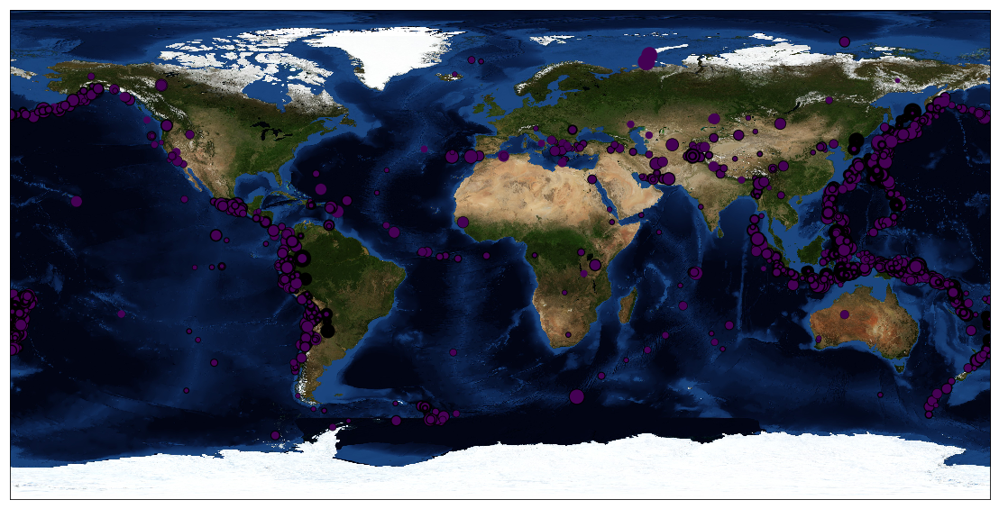

In [3]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as clrs

def plotClusters(labels):
    plt.figure(figsize=(45, 10))
    m2 = Basemap(resolution='c')
    m2.bluemarble()

    size = Raw['Richter'].values
    size = (size - stats['Richter']['min'])/(stats['Richter']['max'] - stats['Richter']['min'])

    width = Raw['Focal depth'].values
    width = np.sqrt((width - stats['Focal depth']['min'])/(stats['Focal depth']['max'] - stats['Focal depth']['min']))

    x, y = m2(Raw['Longitude'].values, Raw['Latitude'].values)
    m2.scatter(x, y, s=350*size, c=labels, marker='o', cmap='viridis', edgecolors='black', linewidths=width*5)
    #cmap = 'viridis' —---> https://matplotlib.org/examples/color/colormaps_refer..
    plt.show()
    
labels = np.repeat(0, Raw.shape[0])
plotClusters(labels)

Сравнив это с первой картинкой из гугла о движении литосферных плит, легко увидеть, что это именно наш случай.

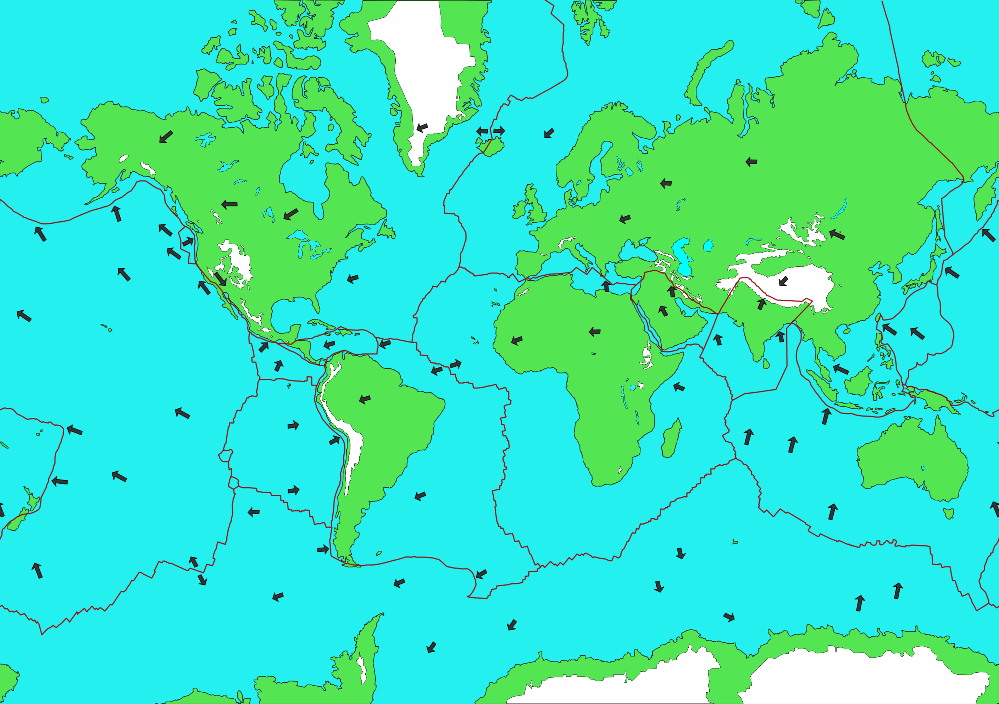

In [4]:
#пруф
from IPython.display import Image
Image(filename='earth-plates.png')

Для кластеризации были использованы следующие алгоритмы:

- K-means 
- EM
- Иерархическая кластеризация
- DBSCAN

## K - means

Этот алгоритм был выбран первым просто потому, что мы раньше уже работали с ним. 

Известно, что алгоритм K-means хорошо работает с шарообразными кластерами одинакового размера. Несмотря на то, что на карте выше не учитываются 2 признака из 4(глубина и сила по шкале Рихтера) изначально заметно, что кластеры будут иметь не шарообразную форму, а скорее вытянутую, а значит этот алгоритм не даст лучшегo результата.

Гиперпараметром для данного алгоритма является количество кластеров. На основе картинок выше мы предположили, что каждый кластер должен совпадать с фронтом движения литосферных плит(черные линии со стрелочками на фотографии). Их мы насчитали 9 штук.

Первым делом, мы запустили алгоритм только для 2 признаков - широты и долготы, чтобы убедиться, что он работает корректно и мы нигде не ошиблись.

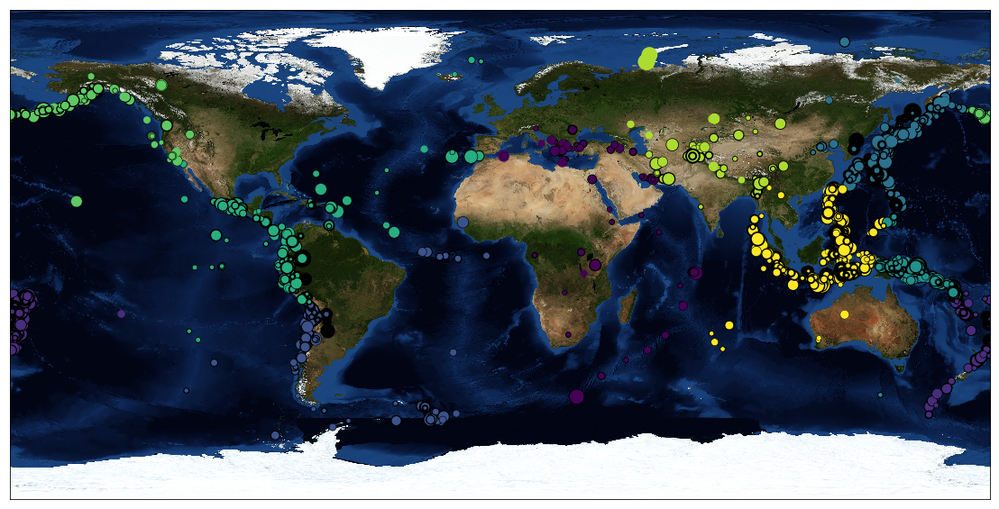

In [5]:
def plotKmeans(data, k):
    from sklearn.cluster import KMeans

    kmeans = KMeans(n_clusters=k, random_state=0).fit(data)
    plotClusters(kmeans.labels_)

X = Raw.copy()
X.loc[X.Longitude < 0, 'Longitude'] += 360.0
plotKmeans(X[['Latitude', 'Longitude']].values, 9)

К каждой точке, у которой была отрицательная долгота, мы прибавили 360, чтобы точки, находящиеся рядом в реальной жизни, но расположенные далеко на карте имели близкие координаты(например фиолетовый кластер находящийся около Новой Зеландии и в левой нижней части карты).

Таким образом мы "передвинули" срез на карте с места, где он находится сейчас, на долготу 0, то есть в центр карты. В таком случае количество точек, которые будут неверно определены по кластерам заметно уменьшается.

После, мы запустили K-means от 4 признаков, но картинка оказалась очень не репрезентативной.Это случилось из-за того, что значения данных находятся в разных отрезках(глубина от 0 до 656, долгота и широта от 0 до 359, значения по шкале Рихтера от 5.9 до 6.9). Чтобы избежать этого мы нормировали все данные, тем самым сделав так, что все признаки будт вносить одинаковый вклад в общую картину.

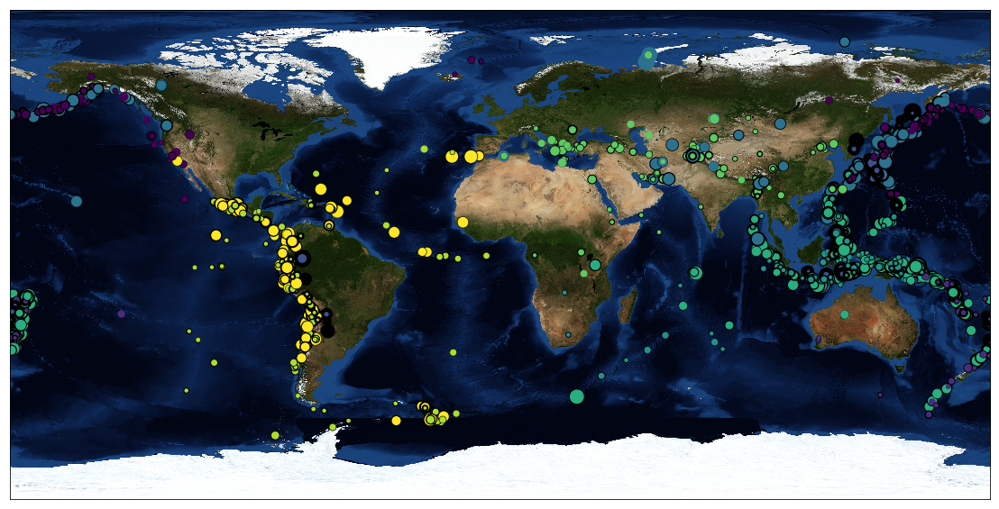

In [6]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X.values)
Y = scaler.transform(X.values, copy=True)
plotKmeans(Y, 9)

Заметно, что общая тенденция, которая была при 2 признаках, сохранилась, но в старых кластерах появились вкрапления других признаков. Это произошло из-за того, что после нормировки наши данные стали иметь нормальное распределение, и большая глубина все же влияет на принадлежность к кластеру. Однако картинка стало намного лучше.

Как и было сказано ранее, метод K-means не дал нам хорошего разбиения.

Чтобы подтвердить число выбранных нами кластеров, которое изначально выбиралось на глазок, мы построили график каменистой осыпи и на нем заметно, что замедление происходит как раз в районе 9. Этим мы подтвердили выбранное нами количество кластеров.

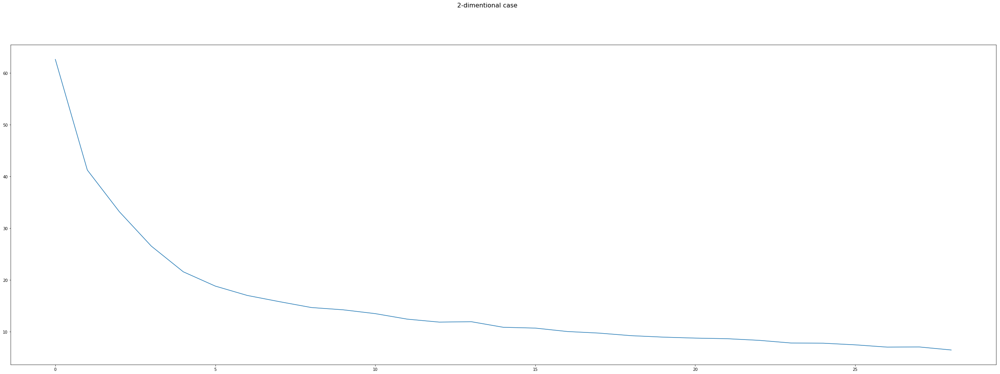

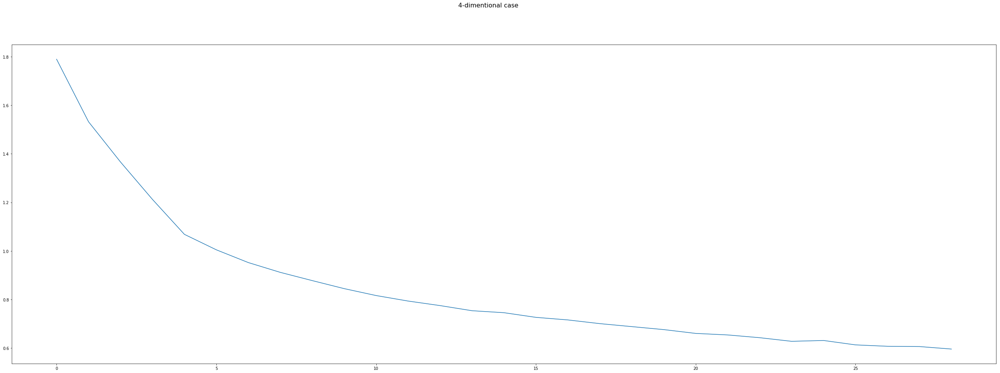

In [7]:
from scipy import cluster

def ScreePlot(d):
    C = X[['Latitude', 'Longitude']].values
    
    if d == 4:
        C = Y        
        
    plt.figure(figsize=(45, 15)).suptitle(str(d) + '-dimentional case', fontsize=16)
    k2centroids = [cluster.vq.kmeans(C, i) for i in range(1, 30)]
    plt.plot([var for (cent, var) in k2centroids])

ScreePlot(2)
ScreePlot(4)

#для 2 и 9 сойдёт, для 4 нужно 13 брать, я думаю

plt.show()

## EM

Следующий алгоритм, который мы использовали для кластеризации, это ЕМ. Поскольку K-means является частным случаем это алгоритма, то рассмотреть его после как некое обобщение кажется логичным.

Известно, что ЕМ хорошо работает для кластеров эллипсойдной формы. Так как по нашим прикидкам именна такую форму имеют наши кластеры в данной работе, то этот метод должен давать нам лучший результат относительно других алгоритмов кластеризации.

Для начала мы построили для 2х признаков:

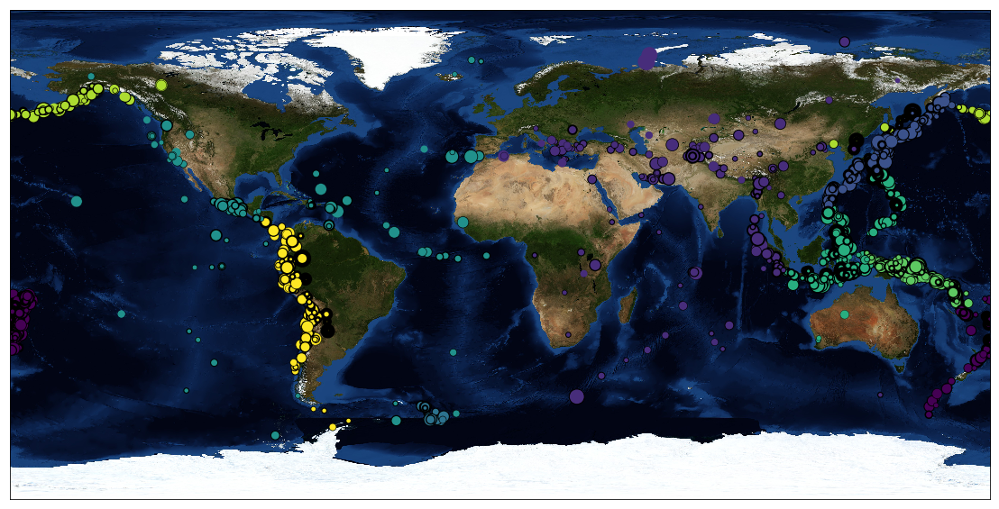

In [8]:
from sklearn.mixture import GaussianMixture
#http://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html

em = GaussianMixture(n_components=9).fit_predict(X[['Latitude', 'Longitude']].values) 
plotClusters(em)

Картина получилась очень хорошая и видна вытянутость кластеров.

Далее мы построили для всех 4 признаков:

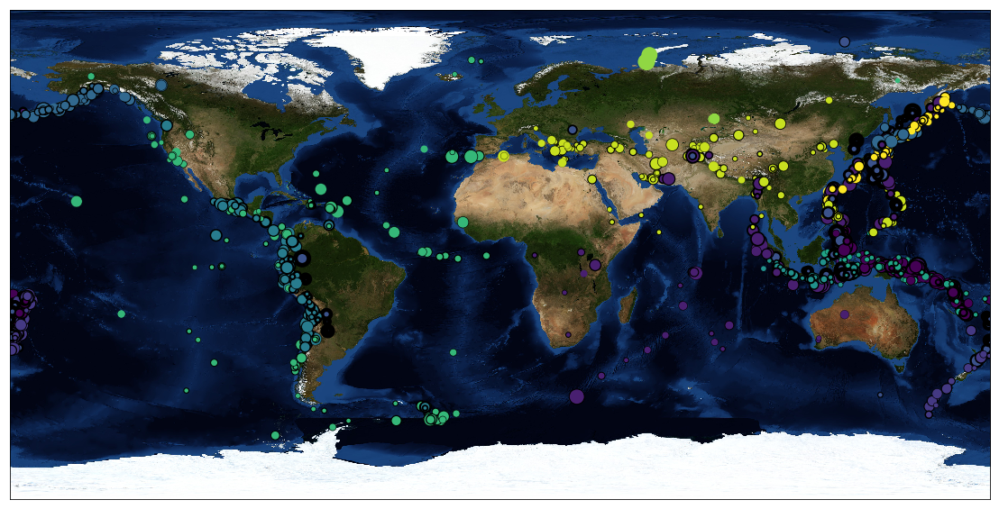

In [9]:
#Я тут поставил 13 кластеров, из-за осыпи, чекни, вроде лучше стало.
em = GaussianMixture(n_components=13).fit_predict(Y) 
plotClusters(em)

Картинка стала менее репрезентативной, но основные тенденции как и в K-means сохранились. По непонятной причине желтому кластеру принадлежат точки по всей земле, хотя они не отличаются особо большой глубиной или большим значением по шкале Рихтера. Возможно поэтому они и попали в 1 кластер.

## Иерархическая кластеризация

Метод кластеризации, основанный на вычислении расстояний между кластерами и обновлением состояния кластеров на каждой из итераций. 

В отличии от предыдущих методов, в этом алгоритме изначально каждая точка это 1 кластер, и по ходу работы они объединяются в кластеры побольше. 

Чтобы определить количество кластеров мы построили дендрограмму:

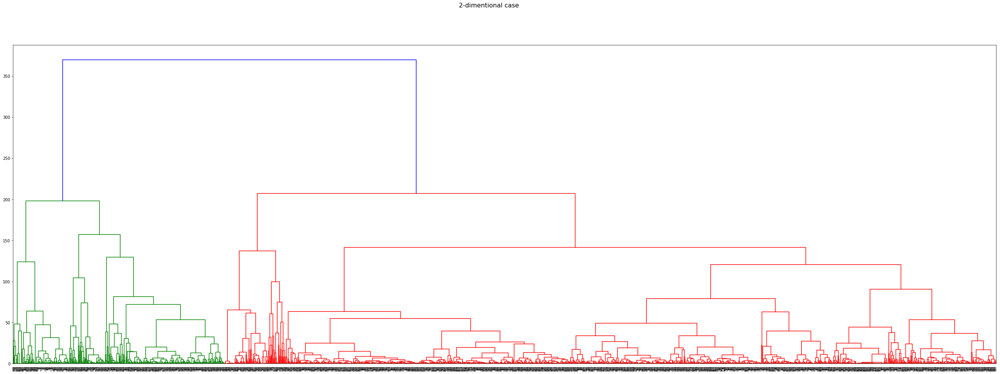

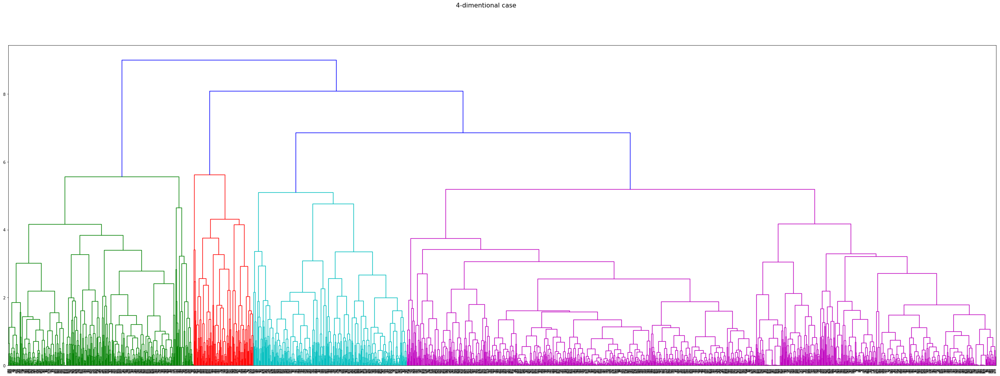

In [10]:
from scipy.cluster.hierarchy import dendrogram, linkage

def dendr(d):
    C = X[['Latitude', 'Longitude']].values
    if d == 4:
        C = Y
    plt.figure(figsize=(45, 15)).suptitle(str(d) + '-dimentional case', fontsize=16)
    Z = linkage(C, 'complete')
    dendrogram(Z)

dendr(2)
dendr(4)

plt.show()

Проанализировав дендрограмму выше мы решили выбрать 10 кластеров.

Для 2 признаков как обычно получилась хорошая наглядная картина:

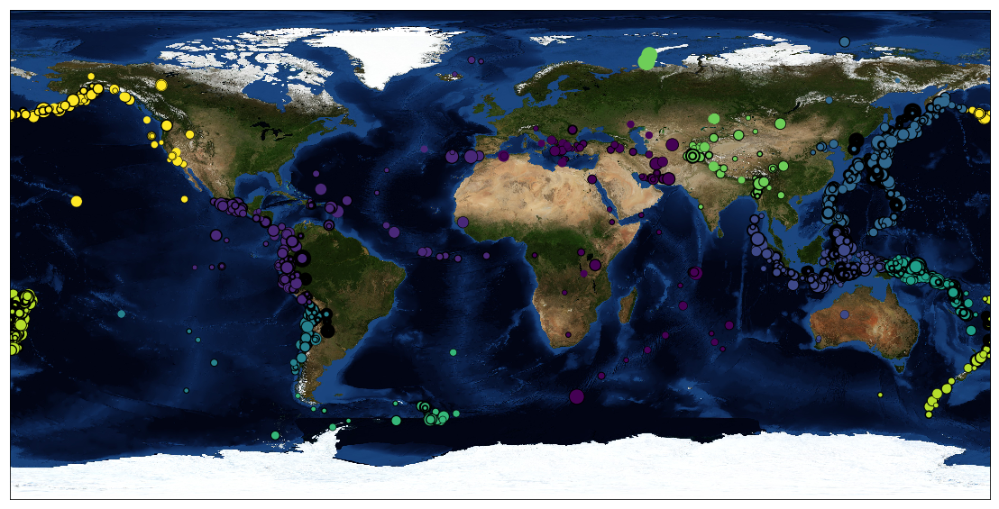

In [11]:
from sklearn.cluster import AgglomerativeClustering
#http://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html

aggCluster = AgglomerativeClustering(n_clusters=10, affinity='euclidean', linkage='ward').fit(X[['Latitude', 'Longitude']].values) 
plotClusters(aggCluster.labels_)

Для 4 же снова картинка не репрезентативна, но сохраняет старый тренд.

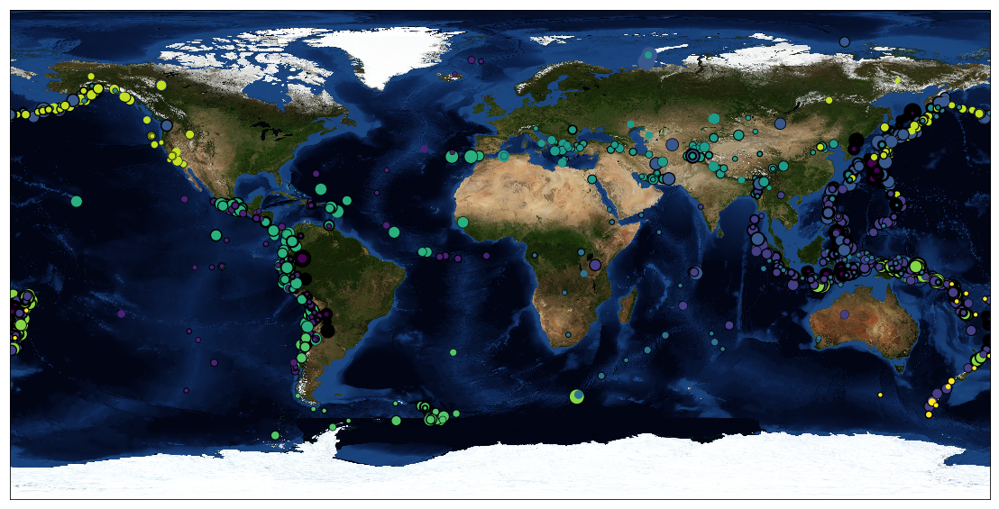

In [12]:
from sklearn.cluster import AgglomerativeClustering
#http://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html

aggCluster = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward').fit(Y) 
plotClusters(aggCluster.labels_)

2 картинки выше были построены при использовании межклассового расстояния Варда. МЫ попробовали использовать и другие виды расстояний.

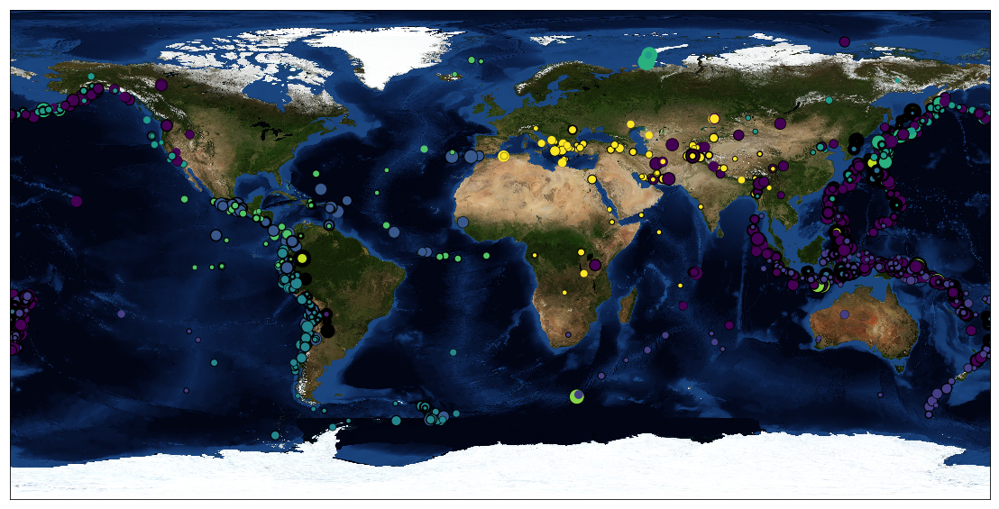

In [13]:
from sklearn.cluster import AgglomerativeClustering
#http://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html

aggCluster = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='complete').fit(Y) 
plotClusters(aggCluster.labels_)

При использовании других видов расстояний наиболее хорошая картинка получилась, когда мы выбрали рсстояния между наиболее удаленными объектами кластеров как на картинке выше.

## DBSCAN

Единственный из используемых в лабораторной методов, который в качесве параметров принимает не количество кластеров, а окрестность eps и минимальное количество точек min_samples, которые должны попасть в эту окрестность, чтобы считать их частью кластера.

Как всегда кластеризация по двум параметрам  выдает довольно наглядную картинку. Количество полученных кластеров при eps = 10, min_samples = 20 равно 7.

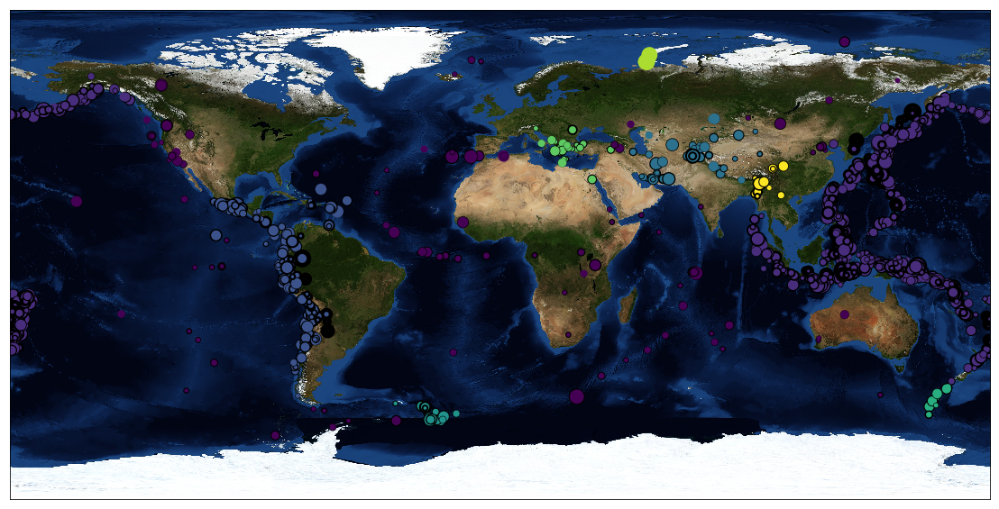

In [14]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=10, min_samples=20, algorithm='ball_tree').fit(X[['Latitude', 'Longitude']].values)
plotClusters(dbscan.labels_)

В силу сложности работы с параметрами у этого алгоритма, мы не смогли подобрать нормальные eps и min_samples, чтобы было хоть какое-то хорошее разделение на кластеры. Лучший получившийся вариант выглядит так:
    
    

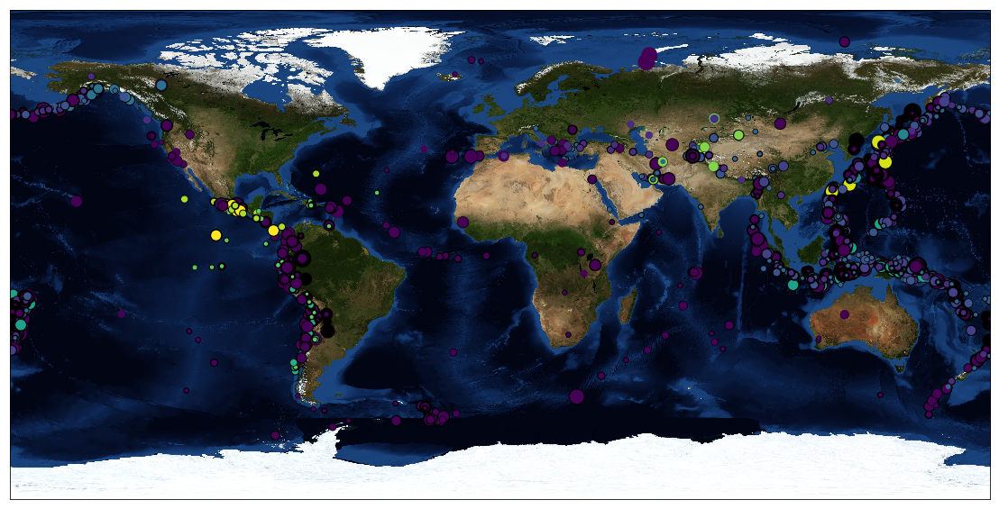

In [15]:
dbscan = DBSCAN(eps=0.45, min_samples=9).fit(Y)
plotClusters(dbscan.labels_)

Подводя итог, можно сказать что:
    
- Все алгоритмы хорошо кластеризуют имеющеся данные по 2 признакам: широте и долготе. Лучший результат показывают K-means и Иерархическая кластеризация. Проблема ЕМ, на который мы ставили в начале работы может заключаться в реализации метода: GaussianMixture хорошо раотает с нормальнораспределенными данными, а пары долгота-широта такими похоже не являются.
- Сами по себе данные(4 признака) не имеют большой зависимости между собой(если не разбивать на 150 кластеров, чтобы можно было искать зависимости между областью на карте, глубиной землетрясения и структурой плит, из-за который такие землетрясения происходят в этой области)

Однако алгоритм ЕМ выдает лучший результат кластеризации, тк StandardScaler, который мы использовали для нормализации данных привел их к нормальному распределению